In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [2]:
reviews=pd.read_csv('extract_reviews.csv')
reviews

,stars,comment
0,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Zebronics has surp...
1,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Zebronics has nail...
2,5.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n \n ...
3,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n - First of all thi...
4,5.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Apple watch looks ...
...,...,...
1286,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Writing this revie...
1287,3.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Purchased today. P...
1288,1.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n \n ...
1289,1.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Zebronics has surp...


In [3]:
reviews=[comment.strip() for comment in reviews.comment] # remove both the leading and the trailing characters
reviews=[comment for comment in reviews if comment] # removes empty strings, because they are considered in Python as False
reviews[0:10]

["Zebronics has surprised me with this fitness band that has premium look and good display... Touch response is good and the watch faces r infinite I think!!! You can add your own wallpaper too... Notifications r instant and vibration is not irritating.. it keeps your phone at bay while driving and if u need to ignore the call u know it already 😜All the contents of the messages from WhatsApp or text doesn't fit well on the screen, apart from this it does everything they claim! Kudos to the Zeb-fit team!",
 'Zebronics has nailed this smart watch ...Why you should buy*Easy u.i*lot of watch faces to choose (you can customise your photo as well )*call and message alert from phone including whats app ,instagram etc.*quality of the watch and belt is premium*battery back up is good compared to smart watch from this range*two straps one black and one red . Both real good quality* photo from the camera of phone can be clickedBrightness is really good even in sunlight*torch light ( screen produc

In [4]:
# Joining the list into one string/text
reviews_text=' '.join(reviews)
reviews_text

'Zebronics has surprised me with this fitness band that has premium look and good display... Touch response is good and the watch faces r infinite I think!!! You can add your own wallpaper too... Notifications r instant and vibration is not irritating.. it keeps your phone at bay while driving and if u need to ignore the call u know it already 😜All the contents of the messages from WhatsApp or text doesn\'t fit well on the screen, apart from this it does everything they claim! Kudos to the Zeb-fit team! Zebronics has nailed this smart watch ...Why you should buy*Easy u.i*lot of watch faces to choose (you can customise your photo as well )*call and message alert from phone including whats app ,instagram etc.*quality of the watch and belt is premium*battery back up is good compared to smart watch from this range*two straps one black and one red . Both real good quality* photo from the camera of phone can be clickedBrightness is really good even in sunlight*torch light ( screen produces b

In [5]:
# Remove Punctuations 
no_punc_text=reviews_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Zebronics has surprised me with this fitness band that has premium look and good display Touch response is good and the watch faces r infinite I think You can add your own wallpaper too Notifications r instant and vibration is not irritating it keeps your phone at bay while driving and if u need to ignore the call u know it already 😜All the contents of the messages from WhatsApp or text doesnt fit well on the screen apart from this it does everything they claim Kudos to the Zebfit team Zebronics has nailed this smart watch Why you should buyEasy uilot of watch faces to choose you can customise your photo as well call and message alert from phone including whats app instagram etcquality of the watch and belt is premiumbattery back up is good compared to smart watch from this rangetwo straps one black and one red  Both real good quality photo from the camera of phone can be clickedBrightness is really good even in sunlighttorch light  screen produces bright light  is useful coming to st

In [6]:
# Tokenization
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\91809\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\91809\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [7]:
from nltk import word_tokenize
text_tokens=word_tokenize(no_punc_text)
print(text_tokens[0:50])

['Zebronics', 'has', 'surprised', 'me', 'with', 'this', 'fitness', 'band', 'that', 'has', 'premium', 'look', 'and', 'good', 'display', 'Touch', 'response', 'is', 'good', 'and', 'the', 'watch', 'faces', 'r', 'infinite', 'I', 'think', 'You', 'can', 'add', 'your', 'own', 'wallpaper', 'too', 'Notifications', 'r', 'instant', 'and', 'vibration', 'is', 'not', 'irritating', 'it', 'keeps', 'your', 'phone', 'at', 'bay', 'while', 'driving']


In [8]:
len(text_tokens)


154906

In [9]:
# Remove stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list=['I','The','It','A']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Zebronics', 'surprised', 'fitness', 'band', 'premium', 'look', 'good', 'display', 'Touch', 'response', 'good', 'watch', 'faces', 'r', 'infinite', 'think', 'You', 'add', 'wallpaper', 'Notifications', 'r', 'instant', 'vibration', 'irritating', 'keeps', 'phone', 'bay', 'driving', 'u', 'need', 'ignore', 'call', 'u', 'know', 'already', '😜All', 'contents', 'messages', 'WhatsApp', 'text', 'doesnt', 'fit', 'well', 'screen', 'apart', 'everything', 'claim', 'Kudos', 'Zebfit', 'team', 'Zebronics', 'nailed', 'smart', 'watch', 'Why', 'buyEasy', 'uilot', 'watch', 'faces', 'choose', 'customise', 'photo', 'well', 'call', 'message', 'alert', 'phone', 'including', 'whats', 'app', 'instagram', 'etcquality', 'watch', 'belt', 'premiumbattery', 'back', 'good', 'compared', 'smart', 'watch', 'rangetwo', 'straps', 'one', 'black', 'one', 'red', 'Both', 'real', 'good', 'quality', 'photo', 'camera', 'phone', 'clickedBrightness', 'really', 'good', 'even', 'sunlighttorch', 'light', 'screen', 'produces', 'bright',

In [10]:
# Normalize the data
lower_words=[comment.lower() for comment in no_stop_tokens]
print(lower_words)

['zebronics', 'surprised', 'fitness', 'band', 'premium', 'look', 'good', 'display', 'touch', 'response', 'good', 'watch', 'faces', 'r', 'infinite', 'think', 'you', 'add', 'wallpaper', 'notifications', 'r', 'instant', 'vibration', 'irritating', 'keeps', 'phone', 'bay', 'driving', 'u', 'need', 'ignore', 'call', 'u', 'know', 'already', '😜all', 'contents', 'messages', 'whatsapp', 'text', 'doesnt', 'fit', 'well', 'screen', 'apart', 'everything', 'claim', 'kudos', 'zebfit', 'team', 'zebronics', 'nailed', 'smart', 'watch', 'why', 'buyeasy', 'uilot', 'watch', 'faces', 'choose', 'customise', 'photo', 'well', 'call', 'message', 'alert', 'phone', 'including', 'whats', 'app', 'instagram', 'etcquality', 'watch', 'belt', 'premiumbattery', 'back', 'good', 'compared', 'smart', 'watch', 'rangetwo', 'straps', 'one', 'black', 'one', 'red', 'both', 'real', 'good', 'quality', 'photo', 'camera', 'phone', 'clickedbrightness', 'really', 'good', 'even', 'sunlighttorch', 'light', 'screen', 'produces', 'bright',

In [11]:
# Stemming
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['zebron', 'surpris', 'fit', 'band', 'premium', 'look', 'good', 'display', 'touch', 'respons', 'good', 'watch', 'face', 'r', 'infinit', 'think', 'you', 'add', 'wallpap', 'notif', 'r', 'instant', 'vibrat', 'irrit', 'keep', 'phone', 'bay', 'drive', 'u', 'need', 'ignor', 'call', 'u', 'know', 'alreadi', '😜all', 'content', 'messag', 'whatsapp', 'text', 'doesnt', 'fit', 'well', 'screen', 'apart', 'everyth', 'claim', 'kudo', 'zebfit', 'team', 'zebron', 'nail', 'smart', 'watch', 'whi', 'buyeasi', 'uilot', 'watch', 'face', 'choos', 'customis', 'photo', 'well', 'call', 'messag', 'alert', 'phone', 'includ', 'what', 'app', 'instagram', 'etcqual', 'watch', 'belt', 'premiumbatteri', 'back', 'good', 'compar', 'smart', 'watch', 'rangetwo', 'strap', 'one', 'black', 'one', 'red', 'both', 'real', 'good', 'qualiti', 'photo', 'camera', 'phone', 'clickedbright', 'realli', 'good', 'even', 'sunlighttorch', 'light', 'screen', 'produc', 'bright', 'light', 'use', 'come', 'step', 'count', 'bpm', 'accur', 'littl',

In [12]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

zebronics surprised fitness band premium look good display touch response good watch faces r infinite think you add wallpaper notifications r instant vibration irritating keeps phone bay driving u need ignore call u know already 😜all contents messages whatsapp text doesnt fit well screen apart everything claim kudos zebfit team zebronics nailed smart watch why buyeasy uilot watch faces choose customise photo well call message alert phone including whats app instagram etcquality watch belt premiumbattery back good compared smart watch rangetwo straps one black one red both real good quality photo camera phone clickedbrightness really good even sunlighttorch light screen produces bright light useful coming step counts bpm accurate little error compared high end watches ok price rangesleep tracker goodapp goodwater dust resistant extent things need improved bezel little big but price goodcharging clip little downside you clip properly charge but get hang slowlyis alternative yesboat launc

In [13]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['zebronic', 'surprise', 'fitness', 'band', 'premium', 'look', 'good', 'display', 'touch', 'response', 'good', 'watch', 'face', 'r', 'infinite', 'think', 'you', 'add', 'wallpaper', 'notification', 'r', 'instant', 'vibration', 'irritate', 'keep', 'phone', 'bay', 'drive', 'u', 'need', 'ignore', 'call', 'u', 'know', 'already', '😜', 'all', 'content', 'message', 'whatsapp', 'text', 'do', 'not', 'fit', 'well', 'screen', 'apart', 'everything', 'claim', 'kudo', 'zebfit', 'team', 'zebronic', 'nail', 'smart', 'watch', 'why', 'buyeasy', 'uilot', 'watch', 'face', 'choose', 'customise', 'photo', 'well', 'call', 'message', 'alert', 'phone', 'include', 'what', 's', 'app', 'instagram', 'etcquality', 'watch', 'belt', 'premiumbattery', 'back', 'good', 'compare', 'smart', 'watch', 'rangetwo', 'strap', 'one', 'black', 'one', 'red', 'both', 'real', 'good', 'quality', 'photo', 'camera', 'phone', 'clickedbrightness', 'really', 'good', 'even', 'sunlighttorch', 'light', 'screen', 'produce', 'bright', 'light', 

In [14]:
clean_reviews=' '.join(lemmas)
clean_reviews

"zebronic surprise fitness band premium look good display touch response good watch face r infinite think you add wallpaper notification r instant vibration irritate keep phone bay drive u need ignore call u know already 😜 all content message whatsapp text do not fit well screen apart everything claim kudo zebfit team zebronic nail smart watch why buyeasy uilot watch face choose customise photo well call message alert phone include what s app instagram etcquality watch belt premiumbattery back good compare smart watch rangetwo strap one black one red both real good quality photo camera phone clickedbrightness really good even sunlighttorch light screen produce bright light useful come step count bpm accurate little error compare high end watch ok price rangesleep tracker goodapp goodwater dust resistant extent thing need improve bezel little big but price goodcharge clip little downside you clip properly charge but get hang slowlyis alternative yesboat launch one watch check write revi

In [15]:
#Feature Extaction 
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
reviewscv=cv.fit_transform(lemmas)


In [16]:
print(cv.vocabulary_)


{'zebronic': 935, 'surprise': 795, 'fitness': 320, 'band': 106, 'premium': 610, 'look': 469, 'good': 349, 'display': 245, 'touch': 838, 'response': 696, 'watch': 887, 'face': 294, 'infinite': 409, 'think': 820, 'you': 929, 'add': 53, 'wallpaper': 880, 'notification': 537, 'instant': 415, 'vibration': 875, 'irritate': 418, 'keep': 434, 'phone': 590, 'bay': 110, 'drive': 259, 'need': 525, 'ignore': 398, 'call': 146, 'know': 438, 'already': 62, 'all': 59, 'content': 194, 'message': 495, 'whatsapp': 904, 'text': 810, 'do': 248, 'not': 533, 'fit': 317, 'well': 900, 'screen': 714, 'apart': 82, 'everything': 278, 'claim': 169, 'kudo': 439, 'zebfit': 934, 'team': 804, 'nail': 523, 'smart': 748, 'why': 908, 'buyeasy': 144, 'uilot': 851, 'choose': 168, 'customise': 213, 'photo': 591, 'alert': 58, 'include': 404, 'what': 903, 'app': 83, 'instagram': 414, 'etcquality': 273, 'belt': 114, 'premiumbattery': 611, 'back': 102, 'compare': 183, 'rangetwo': 654, 'strap': 780, 'one': 553, 'black': 119, 're

In [17]:
print(cv.get_feature_names()[150:300])


['can', 'canot', 'categorybattery', 'center', 'ch', 'change', 'changedtwo', 'charge', 'charger', 'chargervery', 'chargewatch', 'charging', 'chart', 'cheap', 'cheat', 'check', 'chinese', 'choice', 'choose', 'claim', 'class4', 'clean', 'clickedbrightness', 'clip', 'clothe', 'clue', 'color9', 'colour', 'come', 'comfortable', 'comfortabletwo', 'comment', 'company', 'compare', 'complaint', 'completely', 'con', 'concern', 'concerned', 'conectect', 'connect', 'connection', 'connectivity', 'consider', 'content', 'continue', 'continuous', 'continuously', 'control', 'cool', 'correct', 'cost', 'could', 'count', 'counter', 'couple', 'cover', 'coverage', 'cribuzz', 'cross', 'customer', 'customisable', 'customisation', 'customise', 'customizable', 'customize', 'cut', 'damage', 'data', 'datum', 'daughter', 'day', 'daysgo', 'dead', 'deal9', 'deep', 'defect', 'defective', 'definitely', 'delete', 'deliver', 'delivery', 'delivery2', 'depend', 'design', 'detail', 'device', 'different', 'dis', 'disappoint'

C:\Users\91809\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [18]:
print(reviewscv.toarray()[150:300])


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [19]:
print(reviewscv.toarray().shape)


(93333, 939)


In [20]:
#CountVectorizer with N-grams (Bigrams & Trigrams)
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [21]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['accuracy', 'accurate', 'already', 'also', 'app', 'bad', 'battery', 'bright', 'budget', 'build', 'but', 'buy', 'call', 'camera', 'change', 'charge', 'clip', 'come', 'compare', 'con', 'could', 'count', 'day', 'display', 'do', 'end', 'excellent', 'face', 'feature', 'feel', 'first', 'fit', 'get', 'good', 'heartrate', 'hence', 'high', 'instagram', 'lack', 'last', 'launch', 'life', 'light', 'like', 'little', 'load', 'look', 'make', 'many', 'may', 'message', 'money', 'monitor', 'much', 'need', 'not', 'notification', 'one', 'open', 'option', 'overall', 'phone', 'photo', 'premium', 'price', 'pro', 'product', 'properly', 'protector', 'quality', 'really', 'receive', 'recommend', 'replacement', 'resistant', 'review', 'run', 'scratch', 'screen', 'smart', 'smartband', 'step', 'strap', 'there', 'thing', 'think', 'though', 'time', 'touch', 'unit', 'usage', 'use', 'value', 'vibration', 'watch', 'well', 'work', 'you', 'zebfit', 'zebronics']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...

In [22]:
#TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matrix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)


In [23]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matrix_ngram.toarray())

['100', '1499', '15', '17th', '18th', '20', '2k', '2nd', '30', '3755uiwatch', '3days', '45', '455build', '45battery', '475', '55accuracy', '78', '920', 'absolutely', 'acce', 'access', 'accord', 'accuracy', 'accuracy2', 'accurate', 'activities8', 'activity', 'add', 'adjustment', 'after', 'alert', 'all', 'almost', 'already', 'also', 'alternative', 'although', 'always', 'amazed', 'amazefit', 'amazing', 'amazon', 'amazonin', 'and', 'android', 'apart', 'app', 'apple', 'apply', 'apps', 'arcylic', 'as', 'aspectlook', 'atleast', 'available', 'awesome', 'back', 'backup', 'bad', 'band', 'basic', 'battery', 'bay', 'behind', 'belt', 'bet', 'bezel', 'big', 'black', 'both', 'box', 'bp', 'bpm', 'brand', 'break', 'bright', 'brightness3', 'budget', 'build', 'but', 'button', 'buy', 'buyeasy', 'call', 'calling5', 'camera', 'can', 'center', 'ch', 'change', 'charge', 'charger', 'charging', 'cheap', 'check', 'chinese', 'choice', 'choose', 'claim', 'class4', 'clean', 'clickedbrightness', 'clip', 'color9', 'c

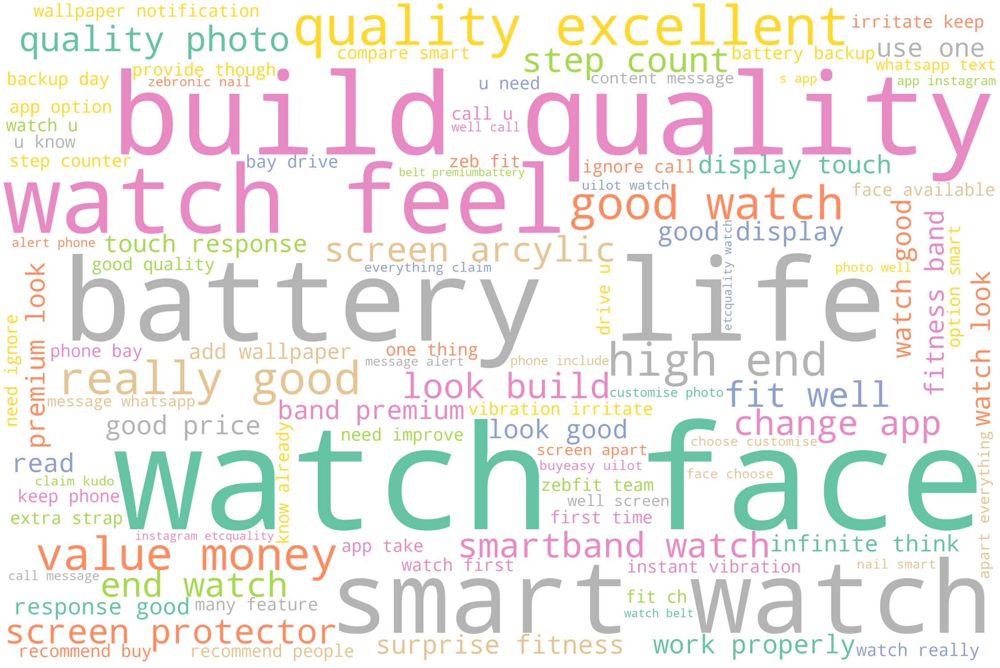

In [24]:
#Generate Word Cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=STOPWORDS).generate(clean_reviews)
plot_cloud(wordcloud)

In [26]:
#Named Entity Recognition (NER)

nlp=spacy.load('en_core_web_sm')

one_block=clean_reviews
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [27]:
for token in doc_block[100:200]:
    print(token,token.pos_)

sunlighttorch NOUN
light NOUN
screen NOUN
produce VERB
bright ADJ
light NOUN
useful ADJ
come VERB
step NOUN
count NOUN
bpm NOUN
accurate ADJ
little ADJ
error NOUN
compare VERB
high ADJ
end NOUN
watch NOUN
ok ADJ
price NOUN
rangesleep NOUN
tracker PROPN
goodapp PROPN
goodwater NOUN
dust NOUN
resistant ADJ
extent NOUN
thing NOUN
need AUX
improve VERB
bezel ADJ
little ADJ
big ADJ
but CCONJ
price NOUN
goodcharge NOUN
clip PROPN
little ADJ
downside NOUN
you PRON
clip VERB
properly ADV
charge VERB
but CCONJ
get VERB
hang PROPN
slowlyis PROPN
alternative PROPN
yesboat PROPN
launch PROPN
one NUM
watch NOUN
check NOUN
write ADJ
reviewoverall ADJ
experience NOUN
past ADP
daysgo NOUN
compare VERB
redmi PROPN
realme PROPN
price PROPN
really ADV
reasonableelegant ADJ
look NOUN
🙏 PROPN
🙏 PROPN
🙏 PROPN
medium NOUN
could AUX
load VERB
receive VERB
today NOUN
follow VERB
rating NOUN
every DET
aspectlook NOUN
455build PROPN
quality NOUN
55accuracy NUM
3755uiwatch NUM
face NOUN
45battery NUM
still ADV
us

In [28]:
# Filtering the nouns and verbs only
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['note', 'm', 'user', 'battery', 'depend', 'nail', 'launch', 'smartwatch', 'price', 'build', 'quality', 'morei', 'recommend', 'run', 'budget', 'buy', 'premium', 'watch', 'recommend', 'people', 'concern', 'accuracy', 'review', 'cover', 'con', 'detail', 'look', 'build', 'quality', 'give', 'price', 'build', 'watch', 'feel', 'strap', 'issue', 'wear', 'usage', 'feel', 'irritation', 'sweating', 'watch', 'feel', 'brightness3', 'come', 'strap', 'brand', 'providing4', 'rise', 'wake', 'feature', 'work', 'step', 'photo', 'heartrate', 'monitor', 'accuracy', 'feel', 'time', 'battery', 'life', 'unit', 'review', 'specify', 'week', 'usage', 'place', 'order', 'replace', 'item', 'get', 'battery', 'life', 'heartrate', 'monitoring', 'go', 'reach', 'battery', 'life', 'less2', 'vibration', 'watch', 'work', 'feel', 'vibration', 'change', 'charge', 'mechanism', 'feel', 'shake', 'vibration', 'charge', 'charging', 'consider', 'place4', 'call', 'reject', 'mute', 'option', 'watch']


In [29]:
# Counting the noun & verb tokens and viewing top 10 results
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq,key=lambda x: x[1],reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10]

,word,count
0,watch,3278
1,face,1079
2,price,974
3,app,971
4,quality,969
5,feel,962
6,battery,860
7,screen,733
8,build,723
9,strap,611


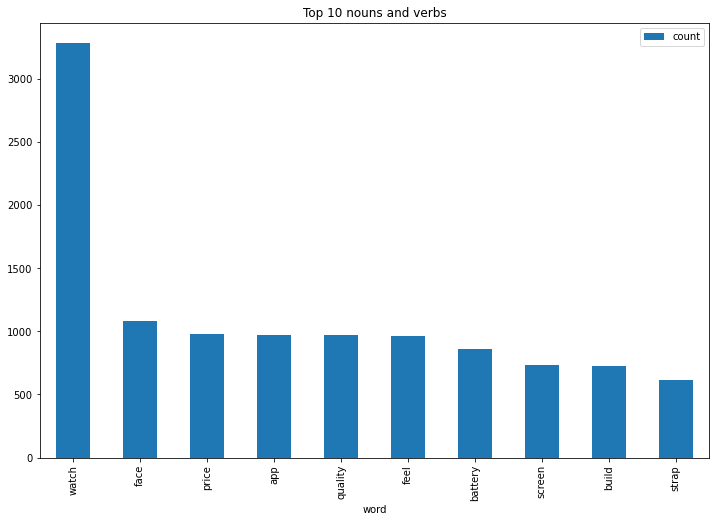

In [30]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');

In [31]:
#Emotion Mining - Sentiment Analysis
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(reviews))
sentences

['Zebronics has surprised me with this fitness band that has premium look and good display... Touch response is good and the watch faces r infinite I think!!!',
 "You can add your own wallpaper too... Notifications r instant and vibration is not irritating.. it keeps your phone at bay while driving and if u need to ignore the call u know it already 😜All the contents of the messages from WhatsApp or text doesn't fit well on the screen, apart from this it does everything they claim!",
 'Kudos to the Zeb-fit team!',
 'Zebronics has nailed this smart watch ...Why you should buy*Easy u.i*lot of watch faces to choose (you can customise your photo as well )*call and message alert from phone including whats app ,instagram etc.',
 '*quality of the watch and belt is premium*battery back up is good compared to smart watch from this range*two straps one black and one red .',
 'Both real good quality* photo from the camera of phone can be clickedBrightness is really good even in sunlight*torch ligh

In [32]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,Zebronics has surprised me with this fitness b...
1,You can add your own wallpaper too... Notifica...
2,Kudos to the Zeb-fit team!
3,Zebronics has nailed this smart watch ...Why y...
4,*quality of the watch and belt is premium*batt...
...,...
8670,Total three.
8671,The media could not be loaded.
8672,The product that i brought has been not workin...
8673,You can add your own wallpaper too... Notifica...


In [34]:
affin=pd.read_csv('Afinn.csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [35]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [36]:
#Score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [38]:
# manual testing
calculate_sentiment(text='good quality')

3

In [42]:
# Calculating sentiment value for each sentence
sent_df['sentiment_value']=sent_df['sentence'].apply(calculate_sentiment)
sent_df['sentiment_value']

0       7
1      -3
2       1
3       0
4       4
       ..
8670    0
8671    0
8672    7
8673   -3
8674    0
Name: sentiment_value, Length: 8675, dtype: int64

In [43]:
#Count of word in each sentence
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0       27
1       59
2        5
3       34
4       26
        ..
8670     2
8671     6
8672    64
8673    19
8674     4
Name: word_count, Length: 8675, dtype: int64

In [44]:
sent_df.sort_values(by='sentiment_value')

,sentence,sentiment_value,word_count
8633,Bad performance and function button is not wor...,-8,24
8564,Shame shame shame!!,-6,3
8649,"Showing heart rate to sofa cover, unhappy wit...",-5,26
8540,One of the worest product in amazon.I suggest ...,-5,40
8657,Absolutely disappointing that such a big and r...,-4,13
...,...,...,...
8558,I had high expectations after watching the rev...,16,92
4470,Apple watch looks like watch built quality exc...,16,52
2026,Apple watch looks like watch built quality exc...,17,79
6119,Apple watch looks like watch built quality exc...,17,79


In [45]:
# Sentiment score of the whole review
sent_df['sentiment_value'].describe()

count    8675.000000
mean        0.939942
std         2.503760
min        -8.000000
25%         0.000000
50%         0.000000
75%         2.000000
max        27.000000
Name: sentiment_value, dtype: float64

In [46]:
# negative sentiment score of the whole review
sent_df[sent_df['sentiment_value']<=0]

,sentence,sentiment_value,word_count
1,You can add your own wallpaper too... Notifica...,-3,59
3,Zebronics has nailed this smart watch ...Why y...,0,34
6,But for the price its good*charging clip is a ...,-2,11
7,You have to clip it properly to charge.,0,8
8,But you will get a hang of it slowlyIs there a...,0,38
...,...,...,...
8669,But the app is poor.No option to turn off Blue...,-1,17
8670,Total three.,0,2
8671,The media could not be loaded.,0,6
8673,You can add your own wallpaper too... Notifica...,-3,19


In [47]:
# positive sentiment score of the whole review
sent_df[sent_df['sentiment_value']>0]

,sentence,sentiment_value,word_count
0,Zebronics has surprised me with this fitness b...,7,27
2,Kudos to the Zeb-fit team!,1,5
4,*quality of the watch and belt is premium*batt...,4,26
5,Both real good quality* photo from the camera ...,10,76
11,Following are my ratings in every aspect:Looks...,6,103
...,...,...,...
8651,Smooth touch screen and has a variety of optio...,11,37
8655,Received the Zebronics fitness band today.,1,6
8659,This encourages me now not to purchase any Ele...,2,11
8664,Watch is working very well and blue tooth conn...,3,15


In [48]:
# Adding index cloumn
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,Zebronics has surprised me with this fitness b...,7,27,0
1,You can add your own wallpaper too... Notifica...,-3,59,1
2,Kudos to the Zeb-fit team!,1,5,2
3,Zebronics has nailed this smart watch ...Why y...,0,34,3
4,*quality of the watch and belt is premium*batt...,4,26,4
...,...,...,...,...
8670,Total three.,0,2,8670
8671,The media could not be loaded.,0,6,8671
8672,The product that i brought has been not workin...,7,64,8672
8673,You can add your own wallpaper too... Notifica...,-3,19,8673


C:\Users\91809\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='sentiment_value', ylabel='Density'>

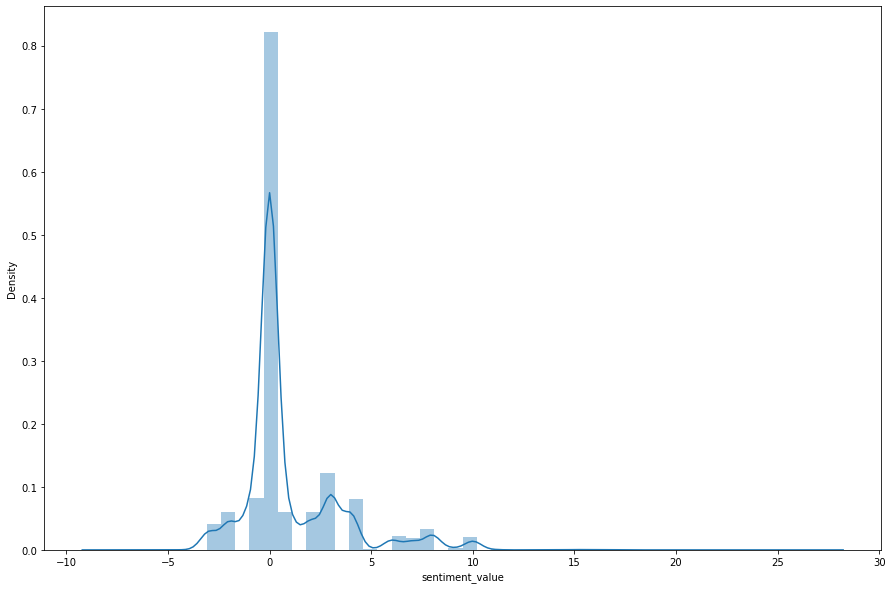

In [49]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sent_df['sentiment_value'])

<AxesSubplot:xlabel='index', ylabel='sentiment_value'>

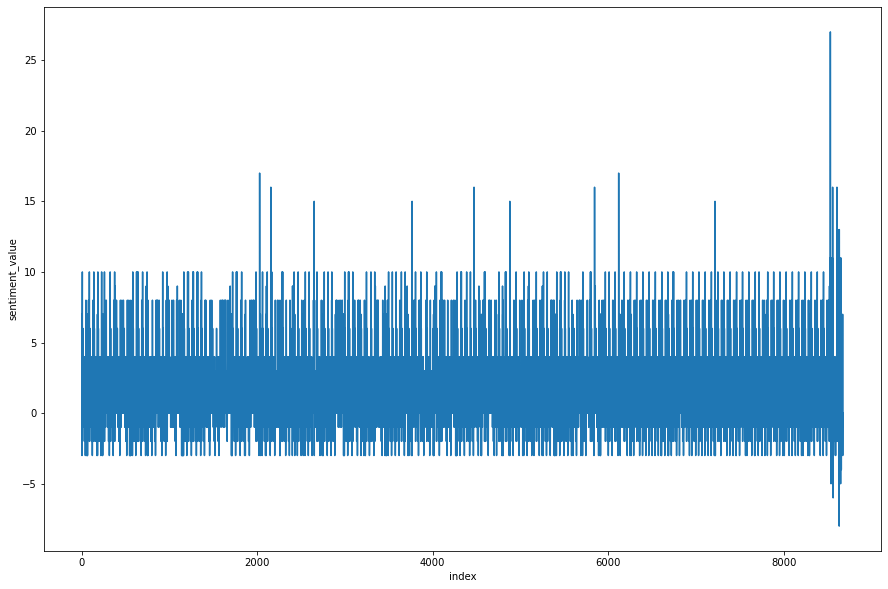

In [50]:
# Plotting the line plot for sentiment value of whole review
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)